# <center> Machine Learning Model on Breast Cancer Data

In [100]:
## ======================================================================
#            Importing the necessary modules and tools
## ======================================================================

import pandas as pd; import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
# import the functions train_test_split() from sklearn.model_selection
from sklearn.model_selection import train_test_split
# Import the Search Algorith GridSearchCV and RandomizedSearchCV
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
# import DecisionTreeClassifier from sklearn.tree 
from sklearn.tree import DecisionTreeClassifier
#from sklearn.metrics import necessary metrics
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix, roc_auc_score
#import KNeighborsClassifier from sklearn.neighbors
from sklearn.neighbors import KNeighborsClassifier as KNN
# import LogisticRegression from sklearn.linear_model
from sklearn.linear_model import LogisticRegression
# Import GridSearchCV
from sklearn.model_selection import GridSearchCV
# Import VotingClassifier, RandomForestClassifier
from sklearn.ensemble import VotingClassifier, RandomForestClassifier
# Import Preprocessing tools
from sklearn.preprocessing import StandardScaler
# Import BaggingClassifier
from sklearn.ensemble import BaggingClassifier


## Step 1: Get the data

In [54]:
# get and read the information about the data
data= pd.read_csv('breastcancer.csv')
data.info()
print('='*40,'\n')
data.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 32 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   diagnosis                569 non-null    object 
 1   id                       569 non-null    int64  
 2   radius_mean              569 non-null    float64
 3   texture_mean             569 non-null    float64
 4   perimeter_mean           569 non-null    float64
 5   area_mean                569 non-null    float64
 6   smoothness_mean          569 non-null    float64
 7   compactness_mean         569 non-null    float64
 8   concavity_mean           569 non-null    float64
 9   concave points_mean      569 non-null    float64
 10  symmetry_mean            569 non-null    float64
 11  fractal_dimension_mean   569 non-null    float64
 12  radius_se                569 non-null    float64
 13  texture_se               569 non-null    float64
 14  perimeter_se             5

,diagnosis,id,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,M,842302,17.990,10.380,122.800,"1,001.000",0.118,0.278,0.300,0.147,...,25.380,17.330,184.600,"2,019.000",0.162,0.666,0.712,0.265,0.460,0.119
1,M,842517,20.570,17.770,132.900,"1,326.000",0.085,0.079,0.087,0.070,...,24.990,23.410,158.800,"1,956.000",0.124,0.187,0.242,0.186,0.275,0.089
2,M,84300903,19.690,21.250,130.000,"1,203.000",0.110,0.160,0.197,0.128,...,23.570,25.530,152.500,"1,709.000",0.144,0.424,0.450,0.243,0.361,0.088
3,M,84348301,11.420,20.380,77.580,386.100,0.142,0.284,0.241,0.105,...,14.910,26.500,98.870,567.700,0.210,0.866,0.687,0.258,0.664,0.173
4,M,84358402,20.290,14.340,135.100,"1,297.000",0.100,0.133,0.198,0.104,...,22.540,16.670,152.200,"1,575.000",0.137,0.205,0.400,0.163,0.236,0.077


### Exploratory Data Analysis (EDA)

In [55]:
data.columns

Index(['diagnosis', 'id', 'radius_mean', 'texture_mean', 'perimeter_mean',
       'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean',
       'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se',
       'fractal_dimension_se', 'radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst', 'smoothness_worst',
       'compactness_worst', 'concavity_worst', 'concave points_worst',
       'symmetry_worst', 'fractal_dimension_worst'],
      dtype='object')

In [56]:
data.shape

(569, 32)

In [57]:
data.isnull().sum()

diagnosis                  0
id                         0
radius_mean                0
texture_mean               0
perimeter_mean             0
area_mean                  0
smoothness_mean            0
compactness_mean           0
concavity_mean             0
concave points_mean        0
symmetry_mean              0
fractal_dimension_mean     0
radius_se                  0
texture_se                 0
perimeter_se               0
area_se                    0
smoothness_se              0
compactness_se             0
concavity_se               0
concave points_se          0
symmetry_se                0
fractal_dimension_se       0
radius_worst               0
texture_worst              0
perimeter_worst            0
area_worst                 0
smoothness_worst           0
compactness_worst          0
concavity_worst            0
concave points_worst       0
symmetry_worst             0
fractal_dimension_worst    0
dtype: int64

In [58]:
data.isna().sum()

diagnosis                  0
id                         0
radius_mean                0
texture_mean               0
perimeter_mean             0
area_mean                  0
smoothness_mean            0
compactness_mean           0
concavity_mean             0
concave points_mean        0
symmetry_mean              0
fractal_dimension_mean     0
radius_se                  0
texture_se                 0
perimeter_se               0
area_se                    0
smoothness_se              0
compactness_se             0
concavity_se               0
concave points_se          0
symmetry_se                0
fractal_dimension_se       0
radius_worst               0
texture_worst              0
perimeter_worst            0
area_worst                 0
smoothness_worst           0
compactness_worst          0
concavity_worst            0
concave points_worst       0
symmetry_worst             0
fractal_dimension_worst    0
dtype: int64

In [59]:
data.diagnosis.unique()

array(['M', 'B'], dtype=object)

In [60]:
data['diagnosis'].value_counts()

B    357
M    212
Name: diagnosis, dtype: int64

<AxesSubplot:xlabel='diagnosis', ylabel='count'>

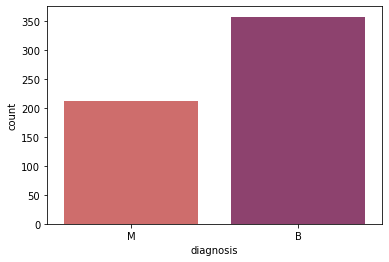

In [61]:
# Plot the target variable
sns.countplot(x="diagnosis", data=data, palette="flare")

In [62]:
cancer=data.drop('id', axis=1)
cancer.head()

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,M,17.990,10.380,122.800,"1,001.000",0.118,0.278,0.300,0.147,0.242,...,25.380,17.330,184.600,"2,019.000",0.162,0.666,0.712,0.265,0.460,0.119
1,M,20.570,17.770,132.900,"1,326.000",0.085,0.079,0.087,0.070,0.181,...,24.990,23.410,158.800,"1,956.000",0.124,0.187,0.242,0.186,0.275,0.089
2,M,19.690,21.250,130.000,"1,203.000",0.110,0.160,0.197,0.128,0.207,...,23.570,25.530,152.500,"1,709.000",0.144,0.424,0.450,0.243,0.361,0.088
3,M,11.420,20.380,77.580,386.100,0.142,0.284,0.241,0.105,0.260,...,14.910,26.500,98.870,567.700,0.210,0.866,0.687,0.258,0.664,0.173
4,M,20.290,14.340,135.100,"1,297.000",0.100,0.133,0.198,0.104,0.181,...,22.540,16.670,152.200,"1,575.000",0.137,0.205,0.400,0.163,0.236,0.077


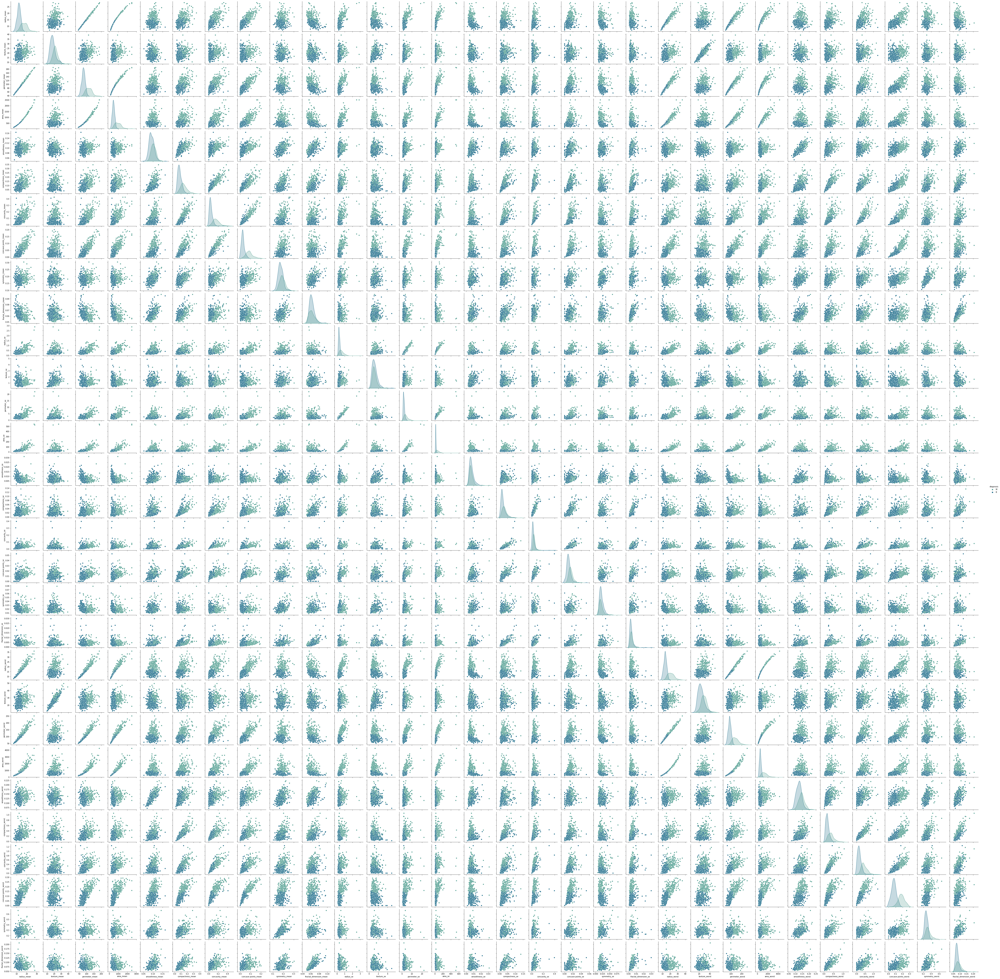

In [27]:
# Plot a pairplot matrix
sns.pairplot(data=cancer, hue='diagnosis', palette='crest')
plt.show()

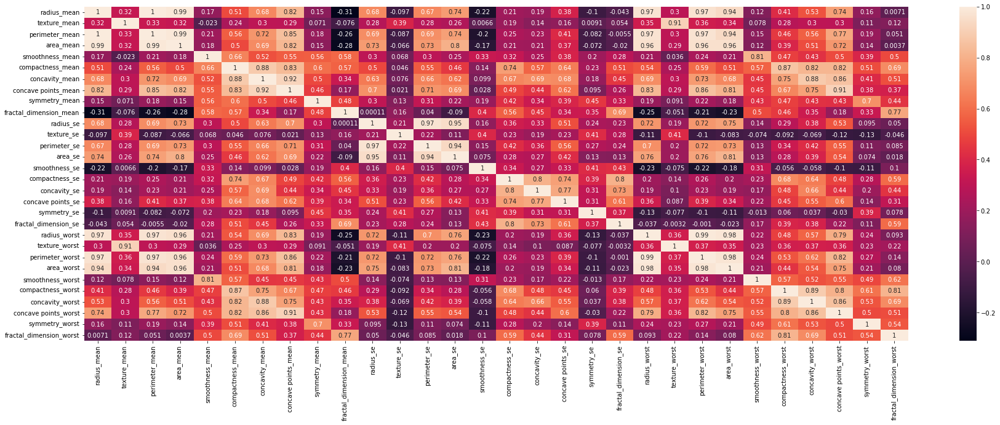

In [63]:

#heat map representing corelations between each feature
plt.figure(figsize=(30,10))
sns.heatmap(cancer.corr(),annot=True)
plt.show()

In [64]:
X= cancer.drop('diagnosis', axis=1)
X

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,17.990,10.380,122.800,"1,001.000",0.118,0.278,0.300,0.147,0.242,0.079,...,25.380,17.330,184.600,"2,019.000",0.162,0.666,0.712,0.265,0.460,0.119
1,20.570,17.770,132.900,"1,326.000",0.085,0.079,0.087,0.070,0.181,0.057,...,24.990,23.410,158.800,"1,956.000",0.124,0.187,0.242,0.186,0.275,0.089
2,19.690,21.250,130.000,"1,203.000",0.110,0.160,0.197,0.128,0.207,0.060,...,23.570,25.530,152.500,"1,709.000",0.144,0.424,0.450,0.243,0.361,0.088
3,11.420,20.380,77.580,386.100,0.142,0.284,0.241,0.105,0.260,0.097,...,14.910,26.500,98.870,567.700,0.210,0.866,0.687,0.258,0.664,0.173
4,20.290,14.340,135.100,"1,297.000",0.100,0.133,0.198,0.104,0.181,0.059,...,22.540,16.670,152.200,"1,575.000",0.137,0.205,0.400,0.163,0.236,0.077
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,21.560,22.390,142.000,"1,479.000",0.111,0.116,0.244,0.139,0.173,0.056,...,25.450,26.400,166.100,"2,027.000",0.141,0.211,0.411,0.222,0.206,0.071
565,20.130,28.250,131.200,"1,261.000",0.098,0.103,0.144,0.098,0.175,0.055,...,23.690,38.250,155.000,"1,731.000",0.117,0.192,0.322,0.163,0.257,0.066
566,16.600,28.080,108.300,858.100,0.085,0.102,0.093,0.053,0.159,0.056,...,18.980,34.120,126.700,"1,124.000",0.114,0.309,0.340,0.142,0.222,0.078
567,20.600,29.330,140.100,"1,265.000",0.118,0.277,0.351,0.152,0.240,0.070,...,25.740,39.420,184.600,"1,821.000",0.165,0.868,0.939,0.265,0.409,0.124


In [65]:
y= cancer['diagnosis']
y

0      M
1      M
2      M
3      M
4      M
      ..
564    M
565    M
566    M
567    M
568    B
Name: diagnosis, Length: 569, dtype: object

In [31]:
#Encoding categorical data values.
from sklearn.preprocessing import LabelEncoder
y=LabelEncoder().fit_transform(y)
y

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1,
       1, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 1,
       0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 1,
       0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0,
       0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1,
       1, 0, 1, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 0,
       0, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1,
       1, 1, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1,
       0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0,
       0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1,

In [66]:
# Split the data into training and test set
X_train, X_test, y_train, y_test = train_test_split(X, 
                                                    y, 
                                                    stratify=y,
                                                    random_state=1711)

# <center> KNeighborsClassifier KNN

In [67]:
# Create empty list for storing the accuracy on both train and test sets

training_accuracy = [] 
test_accuracy = []

# try n_neighbors from 1 to 20 
neighbors_space = range(1, 20)

# Loop over the k neighobors_space (1, 20)
for n_neighbors in neighbors_space:
    
# build the KNN classifier model
    clf = KNeighborsClassifier(n_neighbors = n_neighbors)
    clf.fit(X_train, y_train) 
    
    # Record the training set accuracy
    training_accuracy.append(clf.score(X_train, y_train)) 
    
    # record generalization accuracy 
    test_accuracy.append(clf.score(X_test, y_test))

In [69]:
ideal_test=np.argmax(test_accuracy)
ideal_test

5

In [70]:
# Create a knn classifier Object with k=5
KNN_MODEL= KNeighborsClassifier(n_neighbors=5)
# Fit knn classifier
KNN_MODEL=KNN_MODEL.fit(X_train,y_train)


In [71]:
#prediction using KNN model 
y_pred=KNN_MODEL.predict(X_test)

<AxesSubplot:>

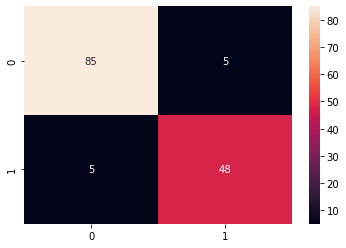

In [72]:
#confusion Matrix
cm=confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True)

In [73]:
#classification_report
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           B       0.94      0.94      0.94        90
           M       0.91      0.91      0.91        53

    accuracy                           0.93       143
   macro avg       0.93      0.93      0.93       143
weighted avg       0.93      0.93      0.93       143



In [74]:
# Score the knn classifier 
acc = KNN_MODEL.score(X_test, y_test)

# Print the accuracy
print("The model Accuracy is".center(70))
print("="*70)
print("Test set accuracy: {:.2f}".format(acc))
print("-"*70)

                        The model Accuracy is                         
Test set accuracy: 0.93
----------------------------------------------------------------------


# <center>  LogisticRegression method

In [75]:
from sklearn.linear_model import LogisticRegression

In [78]:
Logistic_Model = LogisticRegression()
Logistic_Model.fit(X_train, y_train)

C:\Users\moham\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression()

In [79]:
#prediction using Logistic model
y_pred_logistic= Logistic_Model.predict(X_test)

<AxesSubplot:>

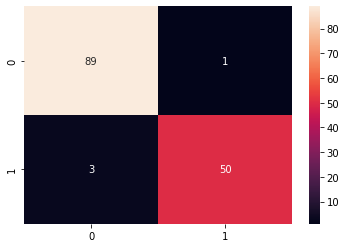

In [81]:
cm_logistic = confusion_matrix(y_test, y_pred_logistic)
sns.heatmap(cm_logistic, annot=True)

In [84]:
print(confusion_matrix(y_test, y_pred_logistic))

[[89  1]
 [ 3 50]]


In [82]:
print(classification_report(y_test, y_pred_logistic))

              precision    recall  f1-score   support

           B       0.97      0.99      0.98        90
           M       0.98      0.94      0.96        53

    accuracy                           0.97       143
   macro avg       0.97      0.97      0.97       143
weighted avg       0.97      0.97      0.97       143



# <center> Classification Decision Tree Hyperparameter 

In [88]:
## =======================================================
#           Tune the decision Tree hyperparameters
## =======================================================

# Define param_grid
decision_tree = DecisionTreeClassifier(random_state=1711) 
                               
params_decision_tree = {
    'max_depth': [2, 3, 4, 6, 8, 10],
    'min_samples_leaf':[0.08,0.1, .12, 0.14, .16, .18],
    }

# Instantiate grid_dt
grid_dt = GridSearchCV(estimator = decision_tree, 
                       param_grid= params_decision_tree,
                       scoring='roc_auc',
                       cv= 10,
                       n_jobs= -1)

In [89]:
# Fit the GridSearchCV object
grid_dt.fit(X_train, y_train)

# Extract best hyperparameters from 'grid_dt' and print them
best_hyperparams = grid_dt.best_params_

print('Best hyerparameters:\n'.center(40))
print("="*50)
print(best_hyperparams)
print("*"*50)

# Extract best CV score from 'grid_dt'
best_CV_score = grid_dt.best_score_

print('Best CV accuracy {}'.format(best_CV_score))


# Extract best model from 'grid_dt'
best_model = grid_dt.best_estimator_

print("*"*50)
print("The best estimator is:")
print("-"*len("The best estimator is:"))
print(best_model)
print("*"*50)

# Predict the test set probabilities of the positive class
y_pred_proba = best_model.predict_proba(X_test)[:,1]

# Compute test_roc_auc
test_roc_auc = roc_auc_score(y_test, y_pred_proba)

# Print test_roc_auc
print('Test set ROC AUC score: {:.3f}'.format(test_roc_auc))
print("="*50)

         Best hyerparameters:
          
{'max_depth': 4, 'min_samples_leaf': 0.08}
**************************************************
Best CV accuracy 0.9612686965811964
**************************************************
The best estimator is:
----------------------
DecisionTreeClassifier(max_depth=4, min_samples_leaf=0.08, random_state=1711)
**************************************************
Test set ROC AUC score: 0.970


In [90]:
#fit the model
Decision_Tree = DecisionTreeClassifier(max_depth=4,
                                       min_samples_leaf=0.08,
                                       random_state=1711) 
Decision_Tree.fit(X_train, y_train)
#predict the model
y_pred_dt=Decision_Tree.predict(X_test)

In [91]:
# Predict the test set probabilities of the positive class
y_pred_proba =Decision_Tree.predict_proba(X_test)[:,1]

# Compute test_roc_auc
test_roc_auc = roc_auc_score(y_test, y_pred_proba)

# Print test_roc_auc
print('Test set ROC AUC score: {:.3f}'.format(test_roc_auc))
print("="*50)

Test set ROC AUC score: 0.970


<AxesSubplot:>

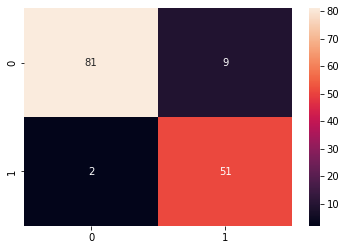

In [92]:
#confusion Matrix
cm_DT= confusion_matrix(y_test,y_pred_dt)
sns.heatmap(cm_DT, annot=True)

In [93]:
print(confusion_matrix(y_test,y_pred_dt))

[[81  9]
 [ 2 51]]


## Voting Classifier

In [97]:
# Scaling the data

sc=StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)


In [98]:
# Instantiate logistic regression
Logistic_Regression = LogisticRegression(random_state=1711)

# Instantiate knn
knn = KNN(n_neighbors=5)

# Instantiate dt
Decision_Tree = DecisionTreeClassifier(max_depth=4,
                                       min_samples_leaf=0.08,
                                       random_state=1711) 

# Define the list classifiers
classifiers = [('Logistic Regression', Logistic_Regression), 
               ('K Nearest Neighbours', knn), 
               ('Classification Tree', Decision_Tree)]

# Iterate over the pre-defined list of classifiers
for clf_name, clf in classifiers:    
 
    # Fit clf to the training set
    clf.fit(X_train, y_train)    
   
    # Predict y_pred
    y_pred = clf.predict(X_test)
    
    # Calculate accuracy
    accuracy = accuracy_score(y_pred, y_test) 
   
    # Evaluate clf's accuracy on the test set
    print('{:20}: {:.3f}'.format(clf_name,  accuracy))

Logistic Regression : 0.972
K Nearest Neighbours: 0.972
Classification Tree : 0.923


In [99]:

# Instantiate a VotingClassifier vc
Voting_Classifier = VotingClassifier(estimators=classifiers)     

# Fit vc to the training set
Voting_Classifier.fit(X_train, y_train)   

# Evaluate the test set predictions
y_pred = Voting_Classifier.predict(X_test)

# Calculate accuracy score
accuracy = accuracy_score(y_pred, y_test)
print('Voting Classifier: {:.3f}'.format(accuracy))

Voting Classifier: 0.986


## <center> Bagging

In [106]:
# Instantiate DecisionTree
# ==============

# Instantiate bc
# ==============
Bagging_Classifier = BaggingClassifier(base_estimator=Decision_Tree,
                       n_estimators= 300,
                       oob_score=True,                
                       random_state=1711)


# Fit bc to the training set
# =========================
Bagging_Classifier.fit(X_train, y_train)

# Predict test set labels
# -----------------------
y_pred = Bagging_Classifier.predict(X_test)

# Evaluate OOB accuracy
# ---------------------
oob_acc = Bagging_Classifier.oob_score_

# Evaluate test set accuracy
# --------------------------
test_acc = accuracy_score(y_pred, y_test)

# Print acc_test and acc_oob
# --------------------------
print("*"*50)
print('Test set accuracy: {:.3f}'.format(test_acc))
print("*"*50)
print('The OOB accuracy: {:.3f}'.format(oob_acc))

**************************************************
Test set accuracy: 0.930
**************************************************
The OOB accuracy: 0.927


In [107]:
# Instantiate Logistic Regression
# ==============

# Instantiate bc
# ==============
Bagging_Classifier_Logistic = BaggingClassifier(base_estimator=Logistic_Regression,
                       n_estimators= 300,
                       oob_score=True,
                       random_state=1711)


# Fit bc to the training set
# =========================
Bagging_Classifier_Logistic.fit(X_train, y_train)

# Predict test set labels
# -----------------------
y_pred = Bagging_Classifier_Logistic.predict(X_test)

# Evaluate test set accuracy
# --------------------------
test_acc = accuracy_score(y_pred, y_test)

# Evaluate OOB accuracy
# ---------------------
oob_acc =  Bagging_Classifier_Logistic.oob_score_

# Print acc_test and acc_oob
# --------------------------
print("*"*50)
print('Test set accuracy: {:.3f}'.format(test_acc))
print("*"*50)
print('The OOB accuracy: {:.3f}'.format(oob_acc))

**************************************************
Test set accuracy: 0.972
**************************************************
The OOB accuracy: 0.981


In [108]:
# Instantiate KNN
# ==============

# Instantiate bc
# ==============
Bagging_Classifier_knn = BaggingClassifier(base_estimator=knn,
                       n_estimators= 300,
                       oob_score=True,                    
                       random_state=1711)


# Fit bc to the training set
# =========================
Bagging_Classifier_knn.fit(X_train, y_train)

# Predict test set labels
# -----------------------
y_pred = Bagging_Classifier_knn.predict(X_test)

# Evaluate test set accuracy
# --------------------------
test_acc = accuracy_score(y_pred, y_test)

# Evaluate OOB accuracy
# ---------------------
oob_acc = Bagging_Classifier_knn.oob_score_

# Print acc_test and acc_oob
# --------------------------
print("*"*50)
print('Test set accuracy: {:.3f}'.format(test_acc))
print("*"*50)
print('The OOB accuracy: {:.3f}'.format(oob_acc))

**************************************************
Test set accuracy: 0.979
**************************************************
The OOB accuracy: 0.962


## Random Forest

In [111]:

# Or Instantiate a random forests classifier 'rf_clf'
RandomForest_Classifier = RandomForestClassifier(random_state= 1711)

# Define a grid of hyperparameter 'params_rf_reg' (the same for classifier)
params_rf_clf = {
              'n_estimators': [300, 400, 500],
              'max_depth': [4, 6, 8],
              'min_samples_leaf': [0.1, 0.2, 0.3, 0.4, 0.5],
              'max_features': ['log2', 'sqrt']
}


# Instantiate 'grid_rf_clf'
grid_rf_clf = GridSearchCV(estimator=RandomForest_Classifier,
                       param_grid=params_rf_clf,
                       cv=5,
                       scoring='neg_mean_squared_error',
                       verbose=1,
                       n_jobs=-1)


 # Fit 'grid_rf_clf' to the training set
grid_rf_clf.fit(X_train, y_train)

 # Extract the best hyperparameters from 'grid_rf'
best_hyperparams = grid_rf_clf.best_params_
print('Best hyperparameters:\n', best_hyperparams)

 # Extract the best model from 'grid_rf'
best_model = grid_rf_clf.best_estimator_

# Predict the test set labels
y_pred = best_model.predict(X_test)

# Evaluate test set accuracy

test_acc = accuracy_score(y_pred, y_test)

# Print the test set RMSE
print('The Accuracy is : {:.2f}'.format(test_acc))

Fitting 5 folds for each of 90 candidates, totalling 450 fits


C:\Users\moham\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:922: UserWarning: One or more of the test scores are non-finite: [nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan]
  warnings.warn(


Best hyperparameters:
 {'max_depth': 4, 'max_features': 'log2', 'min_samples_leaf': 0.1, 'n_estimators': 300}
The Accuracy is : 0.94


<AxesSubplot:>

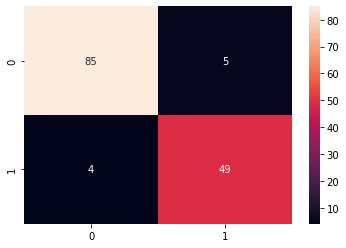

In [114]:
cm_RandomForest = confusion_matrix(y_test, y_pred)
sns.heatmap(cm_RandomForest, annot=True)

In [115]:
print(confusion_matrix(y_test, y_pred))

[[85  5]
 [ 4 49]]


In [116]:
# Predict the test set probabilities of the positive class
y_pred_proba =best_model.predict_proba(X_test)[:,1]

# Compute test_roc_auc
test_roc_auc = roc_auc_score(y_test, y_pred_proba)

# Print test_roc_auc
print('Test set ROC AUC score: {:.3f}'.format(test_roc_auc))
print("="*50)

Test set ROC AUC score: 0.990
